# Inference

This document partially covers the following modules:

* `tramway.analyzer.mapper`
* `tramway.analyzer.browser`

***

<p style="text-align: center;"><a href="https://mybinder.org/v2/gh/DecBayComp/tramway-tour/HEAD?filepath=notebooks%2Finference.ipynb">
<img alt="Binder" src="https://mybinder.org/badge_logo.svg" />
</a></p>

***

Like most of the pages of this documentation, this one originates from a IPython notebook and, as a consequence, the code examples are sequentially run, hence the inclusion of a few transition steps.

**TRamWAy** features multiple models to infer physical properties of random walks, including diffusivity, effective potential, drift, force, etc.
Most of the available models are based on the overdamped Langevin equation.


## Models for random walks

For extensive introduction, please refer to the [official documentation](https://tramway.readthedocs.io/en/latest/inference.html#concepts) and the [InferenceMAP paper](https://doi.org/10.1016/j.bpj.2008.12.2191) and [webpage](https://research.pasteur.fr/en/software/inferencemap/).

Briefly, we consider the problem of maximizing the posterior probability for model parameters $\theta$ given the observed particle displacements $T_i = {(\Delta t_j, \Delta\textbf{r}_j)}$ partitioned into bins or microdomains whose index is denoted by $i$:

$$
\newcommand{argmax}{\underset{\theta}{\operatorname{argmax}}}
\argmax P(\theta|T) = \argmax P(\theta) \prod_i P(T_i|\theta_i)
$$

The various models **TRamWAy** features give different formulae for the local likelihoods $P(T_i|\theta_i)$.
In addition, $P(\theta)$ can be treated as a regularization term, often in the shape of an improper prior (not normalized).

The main models are recaped in the following table:

| model name | &nbsp; model parameters &nbsp; | equation for the individual displacements &nbsp; &nbsp; &nbsp; |
--: | :-: | :--
| D [1](#d) [2](https://tramway.readthedocs.io/en/latest/inference.html#d-inference) | diffusivity $D$ | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t)$ |
| DD [1](#dd) [2](https://tramway.readthedocs.io/en/latest/inference.html#dd-inference) | diffusivity $D$<br />drift $\textbf{a}$ | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t) + \textbf{a}(\textbf{r})$ |
| DF [1](#df) [2](https://tramway.readthedocs.io/en/latest/inference.html#df-inference) | diffusivity $D$<br />force $\textbf{F}$ | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t) + D(\textbf{r})\frac{\textbf{F}(\textbf{r})}{k_{\textrm{B}}T}$ |
| DV [1](#dv) [2](https://tramway.readthedocs.io/en/latest/inference.html#dv-inference) | diffusivity $D$<br /><span style="white-space: nowrap;">effective potential $V$</span> | $\frac{d\textbf{r}}{dt} = \sqrt{2D(\textbf{r})} \xi(t) - D(\textbf{r}) \frac{\nabla V(\textbf{r})}{k_{\textrm{B}}T}$ |

The [stochastic variant](#dv) for the <abbr title="D=diffusivity  V=effective potential">DV</abbr> model is covered in more details.

In [1]:
from tramway.analyzer import *
import numpy as np

In [2]:
from src.inference import set_notebook_theme
# this actually does something only for *dark* themes
set_notebook_theme('light')

from matplotlib import pyplot as plt

The preset analyzer is programmed to load a designated <abbr title="Single Particle Tracking">SPT</abbr> data file, extract the data in a single region of interest, build a k-means-based tessellation, and assign the particle locations to the different Voronoi cells with an additional adjustment to ensure at least 10 locations are associated with each cell.

See [`preset_analyzer` source](https://github.com/DecBayComp/tramway-tour/blob/master/src/inference/__init__.py#L17).

In [3]:
from src.inference import reset_data, preset_analyzer
reset_data()

### Localization error

All the models above derive a similar likelihood function.
As an example, for the [<abbr title="D=diffusivity  V=effective potential">DV</abbr> model](#dv), at bin $i$ with assigned displacements $T_i$, the local likelihood is:

$$
P(T_i | D_i, V_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left\lVert\Delta\textbf{r}_j + D_i\frac{\nabla V_i}{k_{\textrm{B}}T}\Delta t_j\right\rVert^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}
$$

with $\sigma^2$ the experimental localization error.

Because $\sigma$ is a parameter of the experimental setup and protocol, it can be set and found in the `spt_data` attribute:

In [4]:
a, _ = preset_analyzer()

a.spt_data.localization_precision

0.02

`localization_precision` is actually a property that sets/reflects the `localization_error` attribute, which corresponds to $\sigma^2$:

In [5]:
a.spt_data.localization_error

0.0004

Such a piece of information is required at several stages of a typical processing chain.
For convenience, the `localization_precision` and `localization_error` attributes are also exposed by the `RWAnalyzer` object and the `mapper` attribute, and point to the same value in memory, with the `localization_precision` properties returning the square-root of `localization_error`.

### D

Assuming the dynamics is solely diffusive in nature, the following likelihood is considered at bin $i$, with observed displacements $T_i$:

$$
P(T_i | D_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\lVert\Delta\textbf{r}_j\rVert^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}
$$

with $\sigma^2$ the [localization error](#localization-error).

In [6]:
d_analyzer, assignment = preset_analyzer()

d_analyzer.mapper = mapper.MapperPlugin('d')

In [7]:
%%time

d_map = d_analyzer.mapper.infer(assignment)

CPU times: user 2.46 s, sys: 81.6 ms, total: 2.55 s
Wall time: 2.48 s


See the [Data structures](#data-structures) section for more information about the returned object.

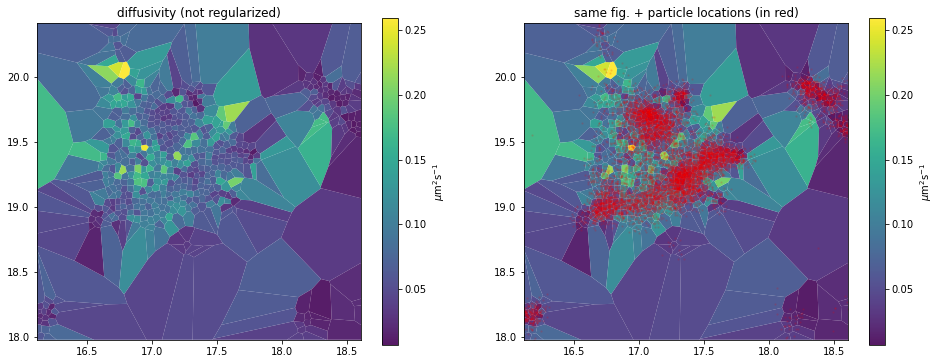

In [8]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

d_analyzer.mapper.mpl.plot(d_map, 'diffusivity', assignment, axes=axes[0], title='diffusivity (not regularized)', unit='std')
d_analyzer.mapper.mpl.plot(d_map, 'diffusivity', assignment, axes=axes[1], title='same fig. + particle locations (in red)', unit='std', overlay_locations=True)

### Smoothing regularizers

To properly estimate the local diffusivity with few data points, we make use of regularizing priors that smooth the diffusivity landscape.

The `'d'`, `'dd'`, `'df'` and `'dv'` models feature the following default penalty on the diffusivity $D$:

$$
P(D) \propto \exp\left(-\lambda\sum_{i} \mathcal{A}_i\lVert(\nabla D)_i\rVert^2\right)
$$

with $\mathcal{A}_i$ the surface area (or volume) of bin $i$, and $(\nabla D)_i$ the gradient of $D$ at bin $i$.

In [9]:
reg_d_analyzer, assignment = preset_analyzer()
reg_d_analyzer.mapper = mapper.MapperPlugin('d')

The $\lambda$ hyperparameter can be set as follows:

In [10]:
m = assignment.number_of_cells # number of bins
n = len(assignment) # number of assigned translocations

roi_surface_area = 2.5 * 2.5  # in µm²

# how large can be a difference in values over a 1-µm distance?
expected_high_delta_D = .3  # in µm²s⁻¹

diffusivity_prior_z = expected_high_delta_D ** 2 * roi_surface_area * m

In [11]:
reg_d_analyzer.mapper.diffusivity_prior = (30 * n) / diffusivity_prior_z

Although the above value of `30` is still to be adjusted, *e.g.* depending on the size of the expected pattern in the diffusivity landscape, the proposed normalization makes this value less variable from a dataset to another.

Indeed, the log-likelihood term in the cost function is a sum over all translocations (`n`), while the regularizing term is a sum over all bins (`m`).

Be careful however, when exploring the hyperparameter space, that it may take much more time for the inference to converge at higher weights on the regularizing prior.
If this happens, as long as at least one iteration was performed, you can interrupt the interpreter with ++ctrl+c++, or the *Interrupt the kernel* button in a notebook.
The solution at the last iteration is returned and the program execution proceeds.

In addition to this smoothing prior, we can also prevent the estimated diffusivity values to become negative, using a Jeffreys' prior:

In [12]:
reg_d_analyzer.mapper.jeffreys_prior = True

A better way to prevent the diffusivity to take negative values would consist of removing the static trajectories.
Such a preprocessing step is skipped here, but systematically performed by the [building blocks mentioned further](#segmenting-and-inferring-all-at-once).

Here, we stick to the Jeffreys' prior solution for comparing with the regularization-free approach.

In [13]:
%%time

reg_d_map = reg_d_analyzer.mapper.infer(assignment)

CPU times: user 8h 10min 58s, sys: 47.5 s, total: 8h 11min 46s
Wall time: 8h 10min 42s


See the [Data structures](#data-structures) section for more information about the returned object.
<a id="example-diffusivity-maps"></a>

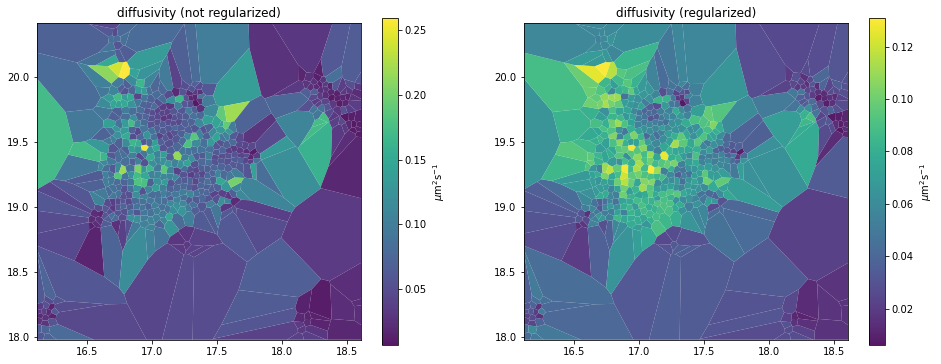

In [14]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

d_analyzer.mapper.mpl.plot(d_map, 'diffusivity', assignment, axes=axes[0], title='diffusivity (not regularized)', unit='std')
reg_d_analyzer.mapper.mpl.plot(reg_d_map, 'diffusivity', assignment, axes=axes[1], title='diffusivity (regularized)', unit='std')

See also the [Spatial smoothing priors](https://tramway.readthedocs.io/en/latest/inference.html#spatial-smoothing-priors) section of the original documentation.

### DD

This model estimates the local drift $\textbf{a}(\textbf{r})$ in a straight-forward fashion, with the following likelihood at bin $i$ and observed displacements $T_i$:

$$
P(T_i | D_i, \textbf{a}_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left\lVert\Delta\textbf{r}_j - \textbf{a}_i\Delta t_j\right\rVert^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}
$$

with $\sigma^2$ the [localization error](#localization-error).

In [15]:
dd_analyzer, assignment = preset_analyzer()

dd_analyzer.mapper = mapper.MapperPlugin('dd')

The `mapper` attribute for `'dd'` features the `diffusivity_prior` and `drift_prior` smoothing hyperparameters.

In [16]:
%%time

dd_maps = dd_analyzer.mapper.infer(assignment)

CPU times: user 3.81 s, sys: 15 µs, total: 3.81 s
Wall time: 3.79 s


See the [Data structures](#Data-structures) section for more information about the returned object.

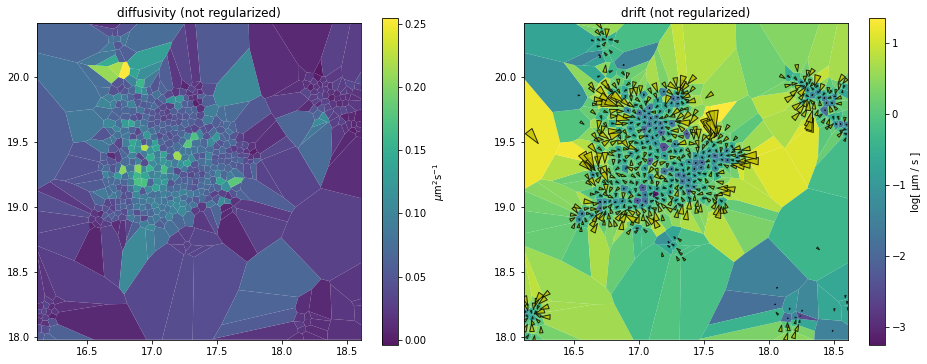

In [17]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

dd_analyzer.mapper.mpl.plot(dd_maps, 'diffusivity', assignment, axes=axes[0], title='diffusivity (not regularized)', unit='std')
dd_analyzer.mapper.mpl.plot(dd_maps, 'drift', assignment, axes=axes[1], title='drift (not regularized)', unit='log[ µm / s ]', transform='log')

### Arrow scaling in field maps
<a id="example-drift-maps"></a>

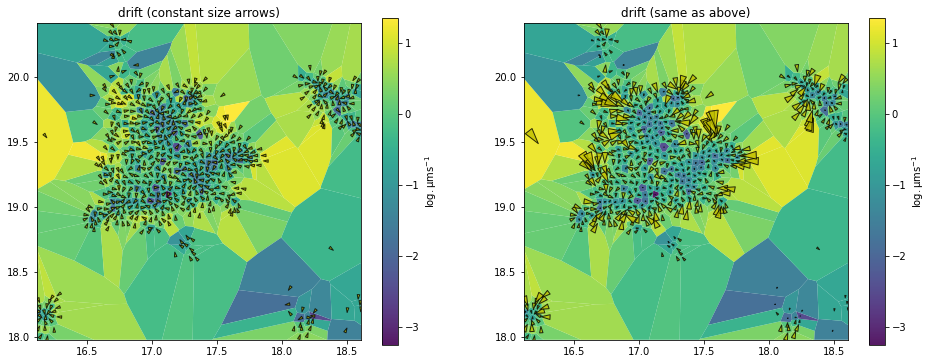

In [18]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

common_args = (dd_maps, 'drift', assignment)
common_kwargs = dict(unit='std', transform='log')

dd_analyzer.mapper.mpl.plot(*common_args, **common_kwargs,
        axes=axes[0], title='drift (constant size arrows)',
        arrow_size='constant', cell_arrow_ratio=1.3) # cell_arrow_ratio is optional

dd_analyzer.mapper.mpl.plot(*common_args, **common_kwargs,
        axes=axes[1], title='drift (same as above)')

### DF

Building upon the [<abbr title="D=diffusivity  D=drift">DD</abbr> model](#dd), the drift is explained by a force $\textbf{F}$ and friction $\gamma$: $\textbf{a}(\textbf{r}) = \frac{\textbf{F}(\textbf{r})}{\gamma(\textbf{r})}$. In addition, assuming equilibrium: $\gamma(\textbf{r}) = \frac{k_{\textrm{B}}T}{D(\textbf{r})}$.

As a consequence, the following likelihood is considered at bin $i$, with observed displacements $T_i$:

$$
P(T_i | D_i, \textbf{F}_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left\lVert\Delta\textbf{r}_j - D_i\frac{\textbf{F}_i}{k_{\textrm{B}}T}\Delta t_j\right\rVert^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}
$$

with $\sigma^2$ the [localization error](#localization-error).

In [19]:
df_analyzer, assignment = preset_analyzer()

df_analyzer.mapper = mapper.MapperPlugin('df')

The `mapper` attribute for `'df'` features the `diffusivity_prior` and `force_prior` smoothing hyperparameters.

In [20]:
%%time

df_maps = df_analyzer.mapper.infer(assignment)

CPU times: user 6.26 s, sys: 124 ms, total: 6.38 s
Wall time: 6.24 s


See the [Data structures](#data-structures) section for more information about the returned object.

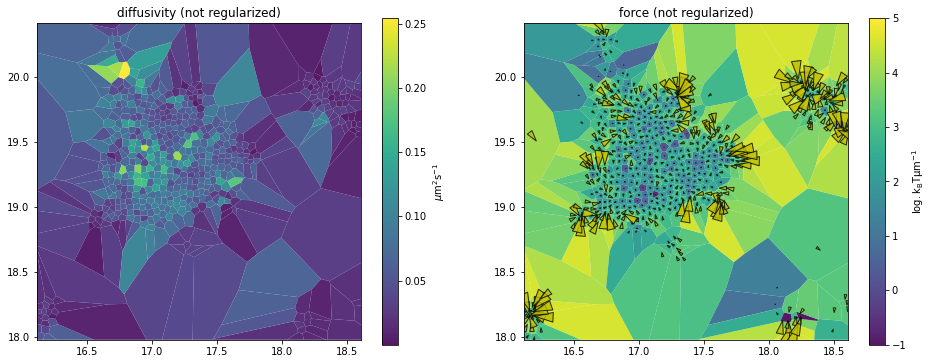

In [21]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

df_analyzer.mapper.mpl.plot(df_maps, 'diffusivity', assignment, axes=axes[0], title='diffusivity (not regularized)', unit='std')
df_analyzer.mapper.mpl.plot(df_maps, 'force', assignment, axes=axes[1], title='force (not regularized)', clim=[-1,5], clip=3, unit='std', transform='log')

### DV

Building upon the [<abbr title="D=diffusivity  F=force">DF</abbr> model](#df), the force field is assumed to be conservative and result from a potential energy: $\textbf{F}(\textbf{r}) = -\nabla V(\textbf{r})$.

The following likelihood is considered at bin $i$, with observed displacements $T_i$:

$$
P(T_i | D_i, V_i) \propto \prod_j \frac{\textrm{exp}\left(-\frac{\left\lVert\Delta\textbf{r}_j + D_i\frac{\nabla V_i}{k_{\textrm{B}}T}\Delta t_j\right\rVert^2}{4\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}\right)}{4\pi\left(D_i+\frac{\sigma^2}{\Delta t_j}\right)\Delta t_j}
$$

with $\sigma^2$ the [localization error](#localization-error). In practice, TRamWAy estimates the dimension-less ratio $\frac{V}{k_{\textrm{B}}T}$ and $V$ is expressed as multiples of $k_{\textrm{B}}T$.

In [22]:
dv_analyzer, assignment = preset_analyzer()

dv_analyzer.mapper = models.DV()

`mapper.MapperPlugin('dv')` is also available but its naive implementation makes it far too slow for the example 635-bin segmentation.
We recommend using `models.DV()` instead which wraps an alternative implementation with a faster gradient calculation for the cost function to be minimized.

Note however that `models.DV()` also features an [alternative regularizer](#setting-the-smoothing-priors).

The `mapper` attribute for `mapper.MapperPlugin('dv')` and `models.DV()` features the `diffusivity_prior` and `potential_prior` smoothing hyperparameters.

The effective potential is implicitly smoothed, already, due to the calculation of $\nabla V$.
The <abbr title="D=diffusivity  V=effective potential">DV</abbr> model is slow for the same reason, that also requires all the parameters to be jointly optimized.

### Stochastic <abbr title="D=diffusivity  V=effective potential">DV</abbr>

A faster stochastic implementation of the [<abbr title="D=diffusivity  V=effective potential">DV</abbr> model](#dv) is available in two flavors: either fully stochastic (`'stochastic.dv'` plugin or `models.DV(variant='stochastic')`), or two-phase with the stochastic approach used first and the standard approach used second for fine-tuning (`'semi.stochastic.dv'` plugin or `models.DV(start='stochastic')`).

The stochastic method is described in a [published article](https://iopscience.iop.org/article/10.1088/1478-3975/ab5167).
As observed in that work, the stochastic variant works well to reach a basin around the solution, and then underperforms within the basin.
That is why we recommend the semi-stochastic approach with a predetermined number of stochastic steps followed by non-stochastic fine-tuning.

Among other benefits of reducing the complexity of the inference, this method makes [spatio-temporal inferences](#spatiotemporal-resolution-of-the-dv-model) possible, that regularize the dynamics parameters across time.

In [23]:
sdv_analyzer, assignment = preset_analyzer()

sdv_analyzer.mapper = models.DV(start='stochastic')

#### Setting the smoothing priors

The `'stochastic.dv'` model features an alternative penalty on the diffusivity $D$ (and similarly on the effective potential $V$):

$$
P(D) \propto \exp\left(-\lambda\sum_{i} \frac{\mathcal{A}_i}{|N_i|}\sum_{j\in N_i}\frac{(D_j-D_i)^2}{||\textbf{r}_j-\textbf{r}_i||^2}\right)
$$

with $i$ all the existing bin/microdomain indices and $N_i$ the subset of neighbor bins.

This is used as a prior probability function but, just like the [default smoothing prior for the other algorithms](#smoothing-regularizers), is not a proper probability function.
Per default, no normalization is performed to allow maximum control on the regularization effect, especially across multiple datasets.


Here we normalize as follows:

In [24]:
m = assignment.number_of_cells # number of bins
n = len(assignment) # number of assigned translocations

roi_surface_area = 2.5 * 2.5  # in µm²

# how large can be a difference in values over a 1-µm distance?
expected_high_delta_D = .3  # in µm² s⁻¹
expected_high_delta_V = 5  # in kT

diffusivity_prior_z = expected_high_delta_D ** 2 * roi_surface_area * m
potential_prior_z = expected_high_delta_V ** 2 * roi_surface_area * m

Due to $\nabla V$ already smoothing the landscape of $V$, we can penalize the spatial variations of $V$ to a lesser extent than those of $D$.

Compared with the [original smoothing prior from InferenceMAP](#smoothing-priors), we will consider lower weights for this prior, usually 4 times lower to account for [how $\nabla V$ is calculated](https://tramway.readthedocs.io/en/latest/gradient.html#gradient) and how many times each difference is counted and scaled.

Again, higher weights on the diffusivity smoothing prior usually make the inference take quite a lot more time, but in the case the inference takes too long, you can interrupt it with ++ctrl+c++, or the *Interrupt the kernel* square button in a notebook.

In [25]:
sdv_analyzer.mapper.diffusivity_prior = (7.5 * n) / diffusivity_prior_z
sdv_analyzer.mapper.potential_prior = (0.5 * n) / potential_prior_z

In [26]:
((7.5 * n) / diffusivity_prior_z, (0.5 * n) / potential_prior_z)

(259.2755905511811, 0.06222614173228346)

#### Running the inference

This is done calling the `infer` method, passing as input argument the assignment previously given by the `sample` method.

In [27]:
%%time

sdv_maps = sdv_analyzer.mapper.infer(assignment)

CPU times: user 3min 24s, sys: 9.39 s, total: 3min 33s
Wall time: 9min 5s


See the [Data structures](#data-structures) section for more information about the returned object.

#### Plotting the inferred parameters
<a id="example-potential-maps"></a>

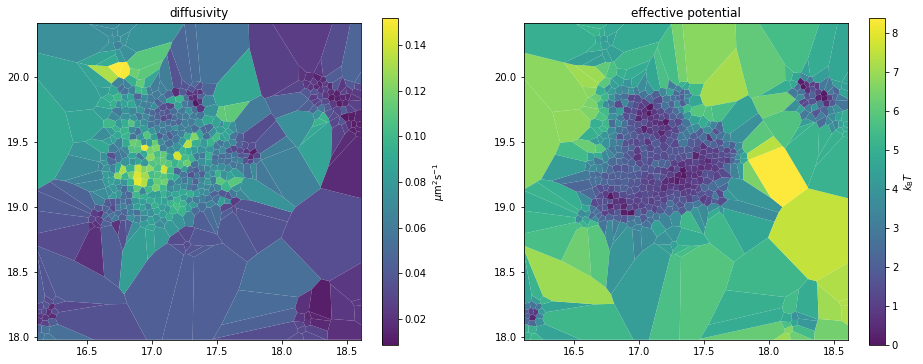

In [28]:
_, axes = plt.subplots(1, 2, figsize=(16,6))

sdv_analyzer.mapper.mpl.plot(sdv_maps, 'diffusivity', assignment, axes=axes[0], title='diffusivity', unit='std')
sdv_analyzer.mapper.mpl.plot(sdv_maps, 'potential', assignment, axes=axes[1], title='effective potential', unit='std')

## Saving parameter maps to *.rwa* files

In the above example, with a single set of maps on a single region of interest, we can explicitly dump the above assignment and maps in a *.rwa* file:

In [29]:
import os.path

a = sdv_analyzer # any of the previously-defined analyzer accesses the same file and can be used here

rwa_file = os.path.splitext(a.spt_data.filepath)[0] + '.rwa'

with a.spt_data.autosaving() as analysis_tree:
    analysis_tree.rwa_file = rwa_file
    analysis_tree['my roi'] = assignment
    analysis_tree['my roi']['my maps 0'] = reg_d_map
    analysis_tree['my roi']['my maps 1'] = sdv_maps

This appends the new records to the existing analyses if the file already exists.

The structure of an analysis tree is flexible, but preferably includes the full <abbr title="Single Particle Tracking">SPT</abbr> data at the root node (as a `DataFrame` object), the different assignments as immediate children nodes (as `Partition` objects), and finally the inferred maps as grand-children (as `Maps` objects):

In [30]:
print(analysis_tree)

<class 'pandas.core.frame.DataFrame'>
	'my roi' <class 'tramway.tessellation.base.Partition'>
		'my maps 0' <class 'tramway.inference.base.Maps'>
		'my maps 1' <class 'tramway.inference.base.Maps'>


This analysis tree can be loaded using the `load_rwa` function exported by the `tramway.helper` module:

In [31]:
%%script echo skipping

from tramway.helper import load_rwa

reloaded_analysis_tree = load_rwa(rwa_file)

print(reloaded_analysis_tree)

assignment = reloaded_analysis_tree['my roi'].data
reg_d_map = reloaded_analysis_tree['my roi']['my maps 0'].data

skipping


Generally speaking, inspecting a *.rwa* file may be easier without the help of the `RWAnalyzer` object, and the reader is referred to the [command-line interface](https://tramway.readthedocs.io/en/latest/inference.html#basic-usage) or the `tramway.helper` [package](https://tramway.readthedocs.io/en/latest/inference.html#basic-usage) for functions like `load_rwa`, `cell_plot` or `map_plot`.

Indeed, an `RWAnalyzer` object cannot be loaded directly from a *.rwa* file.
Especially, a single `RWAnalyzer` object may handle multiple files, and a *.rwa* file may contain analysis artefacts generated by different `RWAnalyzer` objects.

In addition, even a specific analysis path from a *.rwa* file does not contain enough information to rebuild an `RWAnalyzer` object.

First, we would need to have the region of interest defined in an additional file. Such a file can be generated as follows:

In [32]:
roi_file = os.path.splitext(a.spt_data.filepath)[0] + '-roi.txt'

f = single(a.spt_data)
f.roi.to_ascii_file(roi_file)

See the [roi notebook/section](roi.md) about <abbr title="Regions Of Interest">ROI</abbr> for more information.

However, an analysis based on a `RWAnalyzer` object is mostly declarative. The entire computation can be described as a series of attribute assignments, and eventually triggered by a single line of code.

## Segmenting and inferring all at once

To further ease the manipulation of data files, including *.rwa* files, the `tramway.analyzer` package features some convenient building blocks, especially `tessellate_and_infer`.

For example, to reproduce the steps of the <abbr title="D=diffusivity  V=effective potential">DV</abbr> inference above, on top of a k-means-based tessellation with local adjustments to reach a minimum number of 10 data points per space bin:

In [33]:
from tramway.analyzer import *
import numpy as np
import pandas as pd

a = RWAnalyzer()

a.spt_data.from_ascii_file('../data/Image_traj.txt')
a.spt_data.frame_interval = .04  # in s
a.spt_data.localization_precision = .02  # in µm

a.roi.from_ascii_files() # default filepath will be '../data/Image_traj-roi.txt'

a.tesseller = tessellers.KMeans
a.tesseller.resolution = .05  # in µm

a.sampler = sampler.Knn(10)

a.mapper = models.DV(start='stochastic')
# details about the hyperparameters below are omitted
a.mapper.diffusivity_prior = 259.27
a.mapper.potential_prior = 0.062226

In [34]:
a.pipeline.append_stage(stages.tessellate_and_infer(sampling_label='my roi', map_label='my map 0'))

The last expression above does not run the computation. It only schedules it for later execution by the `run` method. The resulting analysis artefacts are saved in a *.rwa* file whose name per default is borrowed by the <abbr title="Single Particle Tracking">SPT</abbr> data filename, replacing the original extension by the *.rwa* extension.

Note that `tessellate_and_infer` (similarly `tessellate`) will discard the static trajectories.
This additional preprocessing step was not performed by the `preset_analyzer` function to keep it as simple as possible.

With a few additional lines, the computation can be dispatched to a computer cluster instead of being run on the local machine. This, however, is out of the scope of this section.

The computation can be triggered calling the `run` method:

In [35]:
%%script echo skipping

a.pipeline.run()

skipping


We skip the execution of the above `run` call so that the present document (originally a Jupyter notebook) can be run in a limited amount of time.

## Post-processing

Instead, if the *.rwa* file already exists, we can load and manipulate it:

In [37]:
stages.reload(skip_missing=False)(a)

To show the same maps as above, in a different flavor, let us plot 3D surfaces:

In [38]:
%%capture
import sys
!"{sys.executable}" -m pip install plotly nbformat

In [2]:
from plotly.io import renderers
renderers.default = 'notebook'
from plotly.subplots import make_subplots
from IPython.display import HTML, display

for r in a.roi.as_support_regions(): # in this example, we have a single ROI
    
    assignment = r.get_sampling('my roi')
    maps = assignment.get_child('my maps 1')
    
    fig = make_subplots(rows=1, cols=2,
        specs=[[{'type': 'surface'}, {'type': 'surface'}]],
        subplot_titles=['diffusivity', 'effective potential'])
    
    a.mapper.plotly.plot_surface(maps, 'diffusivity', assignment, fig=fig, col=0,
        colorbar=dict(thickness=20, x=0.46))
    a.mapper.plotly.plot_surface(maps, 'potential', assignment, fig=fig, col=1,
        colorbar=dict(thickness=20, x=1.02))

    fig.update_layout(
        scene1=dict(
            zaxis=dict(range=[-.08,.15]),
            camera=dict(eye=dict(x=.8, y=.8, z=1.4)),
        ),
        scene2=dict(
            zaxis=dict(range=[-2,8.3]),
            camera=dict(eye=dict(x=.5, y=.5, z=2.)),
        ),
    )

#     fig.show() # nbconvert cannot export the figure this way

    display(HTML(fig.to_html()))

## Data structures

The `Maps` objects previously generated, for example `sdv_maps`, contain the distributed parameter estimates:

In [41]:
print(sdv_maps)

mode:                     semi.stochastic.dv
diffusivity_prior:        259.2755905511811
potential_prior:          0.06222614173228346
runtime:                  544.6461782455444
ls_step_max:              [0.025 0.5  ]
ftol:                     0.001
low_df_rate:              1
allow_negative_potential: True
max_iter:                 20
sigma:                    0.02
verbose:                  False
resolution:               CONVERGENCE: DELTA F <= FTOL/10
niter:                    2
init:                     {'resolution': 'CONVERGENCE: DELTA F < FTOL', 'niter': 43387}
features:                 ['diffusivity', 'potential', 'force']
maps:                     <class 'pandas.core.frame.DataFrame'>


The values can either be accessed reading the `maps` attribute: 

In [42]:
import pandas as pd
pd.set_option('display.max_rows', 6)

In [43]:
sdv_maps.maps

,diffusivity,potential,force x,force y
0,0.054227,4.979276,1.024797,14.472462
1,0.046272,5.025369,21.527693,14.087935
2,0.024227,2.360643,20.089187,26.576126
...,...,...,...,...
632,0.024116,4.559752,3.570716,2.587393
633,0.030418,4.236661,-16.891351,-5.274054
634,0.045488,4.567865,-6.523572,-2.787153


or indexing by parameter name, which may prove convenient for multidimensional measurements:

In [44]:
sdv_maps['force'].rename(columns=lambda name: name.split()[1])

,x,y
0,1.024797,14.472462
1,21.527693,14.087935
2,20.089187,26.576126
...,...,...
632,3.570716,2.587393
633,-16.891351,-5.274054
634,-6.523572,-2.787153


## Spatiotemporal resolution of the <abbr title="D=diffusivity  V=effective potential">DV</abbr> model

In combination with a sliding time window, the <abbr title="Single Particle Tracking">SPT</abbr> data can be segmented in time, in addition to space.

Although it is possible to perform the inference on each time segment independently, it is also possible to run a larger inference for all the dynamics parameters at once, taking benefit from temporal regularization.

This latter approach, however, is far more time-consuming and the `'stochastic.dv'` or `'semi.stochastic.dv'` algorithms are recommended.

To decrease the number of empty spatiotemporal bins, we will typically decrease the spatial resolution (*i.e.* increase the value of the `resolution` attribute that actually represents the bin size).

Let us first set a similar analyzer, compared with the space-only [stochastic <abbr title="D=diffusivity  V=effective potential">DV</abbr>](#stochastic-dv) approach, exposing the details that were previously hidden in the `preset_analyzer` function:

In [45]:
from tramway.analyzer import *
import numpy as np
import pandas as pd

dv_t = RWAnalyzer()

dv_t.spt_data.from_ascii_file('../data/Image_traj.txt')
dv_t.spt_data.frame_interval = .04  # in s
dv_t.spt_data.localization_precision = .02  # in µm

dv_t.roi.from_ascii_files() # default filepath will be '../data/Image_traj-roi.txt'

dv_t.tesseller = tessellers.KMeans
dv_t.tesseller.resolution = .1  # in µm

dv_t.sampler = sampler.Knn(10)

dv_t.mapper = models.DV(start='stochastic')

We first specify the temporal segmentation and regularization hyperparameters:

In [46]:
dv_t.time = time.SlidingWindow(duration=60, shift=30)

Next, to set the spatial regularization hyperparameters, let us generate an assignment (**the** assignment, here, as we have a single <abbr title="Region Of Interest">ROI</abbr> or dataset) to read the number of spatial bins and assigned translocations. The time window must be defined first:

In [47]:
r = single(dv_t.roi)
df = r.discard_static_trajectories(r.crop())
assignment_t = dv_t.sampler.sample(df)

In [48]:
spatial_mesh = dv_t.time.get_spatial_segmentation(assignment_t)
m = spatial_mesh.number_of_cells # number of bins (per time segment)
n = len(assignment_t) # number of assigned translocations

roi_surface_area = 2.5 * 2.5  # in µm²

# how large can be a difference in values over a 1-µm distance?
expected_high_delta_D = .3  # in µm² s⁻¹
expected_high_delta_V = 5  # in kT

diffusivity_prior_z = expected_high_delta_D ** 2 * roi_surface_area * m
potential_prior_z = expected_high_delta_V ** 2 * roi_surface_area * m

Because we split the <abbr title="Single Particle Tracking">SPT</abbr> data in multiple time segments, the proportion of bins that overlap with their neighbors increases, which makes the inferred landscapes smoother (in each time segment) even with no regularization. As a consequence, we decrease the weights for the spatial regularization terms, compared with a time-free assignment with equal resolution.

In addition, regularizing in time is more difficult than in space, because of the very low temporal resolution of the segmentation. Here, we have a 30-s shift between successive segments. The spatial and temporal regularizations may conflict with one another, hence the extra complexity in adjusting the hyperparameters.

In [49]:
weight = 1e-2
dv_t.mapper.diffusivity_prior = (7.5 * weight * n) / diffusivity_prior_z
dv_t.mapper.potential_prior = (.5 * weight * n) / potential_prior_z

In [50]:
dv_t.mapper.diffusivity_time_prior = 100.
dv_t.mapper.potential_time_prior = 100.

Last, we run as usual:

In [51]:
sampling_label = lambda roi_label: roi_label + ' - kmeans + 60s window'
map_label = 'dv maps'

dv_t.pipeline.append_stage(stages.tessellate_and_infer(
    sampling_label=sampling_label,
    map_label=map_label,
    load_rwa_files=True,
    overwrite=True,
))

In [52]:
%%time

dv_t.pipeline.run()

loading .rwa file for source: ../data/Image_traj.txt...
tessellating roi: 'roi000' (in source '../data/Image_traj.txt')...
inferring roi: 'roi000' (in source '../data/Image_traj.txt')...


CPU times: user 19min 58s, sys: 50.2 s, total: 20min 49s
Wall time: 1h 24min 42s


#### `sampling_label`

If no <abbr title="Regions Of Interest">ROI</abbr> are defined, it is safe to pass a static `str` value.

If <abbr title="Regions Of Interest">ROI</abbr> are defined and a single segmentation per <abbr title="Region Of Interest">ROI</abbr> is expected, it is safe to ignore the `sampling_label` argument.

However, if <abbr title="Regions Of Interest">ROI</abbr> are defined and segmenting in multiple ways is not excluded, it is recommended to choose labels that refer both to the <abbr title="Regions Of Interest">ROI</abbr> and the segmentation parameters; hence the above `sampling_label` that takes the default <abbr title="Region Of Interest">ROI</abbr> label and combines it with an additional segmentation-related label.

#### `load_rwa_files` and `overwrite`

Per default, if the <abbr title="Single Particle Tracking">SPT</abbr> data source is not defined as *.rwa* files, `tessellate_and_infer` seeks for corresponding *.rwa* files and loads them if found. The `load_rwa_files` argument controls this behavior and can be set to `False` to override the default.

Per default, if the <abbr title="Single Particle Tracking">SPT</abbr> data source is read from *.rwa* files, including by the action of the `load_rwa_files` argument, if analysis artefacts are already available in the analysis trees with the same labels, the analysis is skipped. The `overwrite` argument controls this behavior and can be set to `True` to override the default.


## Movie rendering

Dynamic maps can be rendered as movies:

In [53]:
r = single(dv_t.roi)
assignment_t = r.get_sampling(sampling_label)
dv_t_maps = assignment_t.get_child(map_label)

In [54]:
%%capture
# initialize the movie for a parameter map
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize=(8,6))

movie = dv_t.mapper.mpl.animate(fig, dv_t_maps, feature='diffusivity',
                axes=ax, unit='std', overlay_locations=True)

In [55]:
# render the movie
from IPython.display import HTML

HTML(movie.to_jshtml())

The `movie` object is a Matplotlib animation. Such objects can be combined as subplots of a same figure:

In [56]:
%%capture
fig, axes = plt.subplots(1, 2, figsize=(16,6))

movie = dv_t.mapper.mpl.animate(fig, dv_t_maps, feature='diffusivity',
                axes=axes[0], unit='std')

movie = dv_t.mapper.mpl.animate(movie, dv_t_maps, feature='potential',
                axes=axes[1], unit='std')

In [57]:
HTML(movie.to_jshtml())

Note that, in the second call to `animate`, `movie` is passed as first argument instead of `fig`.

## Browsing many maps

For datasets with multiple <abbr title="Single Particle Tracking">SPT</abbr> data files and/or multiple regions of interest per files, or else multiple segmentations per region of interest and/or multiple inferred parameter maps per assignment,
the `RWAnalyzer` object features a browsing utility based on the *Bokeh* library and made available as the `browser` attribute of the object.

In [58]:
%%capture
import sys
!"{sys.executable}" -m pip install bokeh==2.2.3

In [59]:
from tramway.analyzer import *

a = RWAnalyzer()
a.spt_data.from_rwa_files('../data/*.rwa')

# the notebook kernel is not aware of the notebook it runs;
# let it know where the code is
a.browser.script = 'inference.ipynb'

# make bokeh run the current notebook cell only, not the entire notebook
a.browser.this_notebook_cell_only = True

a.browser.show_maps()

the designated .ipynb file will be exported;
be sure to save the notebook after any modification
so that the changes are reported in the .ipynb file

running: jupyter nbconvert --to python "inference.ipynb" --stdout
running: python -m bokeh serve --show /tmp/tmpccmdvbt3.py
interrupt the kernel to stop bokeh and proceed back in the notebook
2021-07-17 03:18:32,405 Starting Bokeh server version 2.2.3 (running on Tornado 6.1)
2021-07-17 03:18:32,407 User authentication hooks NOT provided (default user enabled)
2021-07-17 03:18:32,414 Bokeh app running at: http://localhost:5006/tmpccmdvbt3
2021-07-17 03:18:32,415 Starting Bokeh server with process id: 1565566
2021-07-17 03:18:39,212 W-1000 (MISSING_RENDERERS): Plot has no renderers: Figure(id='1007', ...)
2021-07-17 03:18:41,103 404 GET /favicon.ico (127.0.0.1) 1.14ms
2021-07-17 03:18:41,115 WebSocket connection opened
2021-07-17 03:18:41,117 ServerConnection created



At this point the kernel is blocking and waiting for bokeh serve to be halted. In the standard Jupyter interface, you can do so pressing the *Interrupt the kernel* square button, or ++ctrl+c++.

A new window or tab should open in your default web browser. Otherwise, the web interface Bokeh serves should be available on https://localhost:5006/.
Be careful that if the notebook is accessed through an <abbr title="Secure SHell">SSH</abbr> tunnel, so should be the bokeh web interface.

The above code calls a highly experimental feature. The notebook cell should properly run if taken out of the notebook, and therefore include all the necessary imports.
It should not include any IPython magic statements, and the expressions that set the `script` and `this_notebook_cell_only` attributes should be in the cell code, not in imported code, as well as the `browser.show_maps` method call.
The corresponding strings are looked up for in the cell code.

If multiple notebook cells call `browser.show_maps`, attribute `this_notebook_cell_only` should be the cell index in the notebook, in all such cells.

***

<p style="text-align: center;"><a href="https://mybinder.org/v2/gh/DecBayComp/tramway-tour/HEAD?filepath=notebooks%2Finference.ipynb">
<img alt="Binder" src="https://mybinder.org/badge_logo.svg" />
</a></p>